# ЗАГРУЗКА БИБЛИОТЕК И ДАТАСЕТА

In [1]:
# импорт библиотек
import pandas as pd
import numpy as np
import sklearn
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from matplotlib.cbook import boxplot_stats 
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [2]:
# загрузка и просмотр датасетов
# X_bp - бальзатопластик
# X_nup - нашивка углепластика
X_bp = pd.read_excel('../data/X_bp.xlsx', index_col=0)
X_nup = pd.read_excel('../data/X_nup.xlsx', index_col=0)

In [3]:
X_bp

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000
...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [4]:
X_bp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [5]:
X_nup

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.000000,57.000000
1,0,4.000000,60.000000
2,0,4.000000,70.000000
3,0,5.000000,47.000000
4,0,5.000000,57.000000
...,...,...,...
1035,90,8.088111,47.759177
1036,90,7.619138,66.931932
1037,90,9.800926,72.858286
1038,90,10.079859,65.519479


In [6]:
X_nup.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1040 entries, 0 to 1039
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   int64  
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 32.5 KB


In [7]:
# нечисловых значений и значений null ни у одной фичи нет, но также нет и иных сведений для объединения датафреймов, 
# кроме индекса строки -> объединяем по индексу с отбрасыванием несовпадающих строк
df = X_bp.join(X_nup, how='inner')
df.sample(n=10, random_state=42).T

,525,357,444,31,618,587,447,734,76,715
Соотношение матрица-наполнитель,3.790051,2.661267,3.174404,1.771436,3.276517,3.521605,3.501415,2.546782,1.940021,2.009728
"Плотность, кг/м3",1962.764956,1948.878616,1980.823788,1872.491560,1911.245306,1993.219156,2037.052469,1854.074417,1969.623612,1856.029075
"модуль упругости, ГПа",673.263749,719.246538,459.047070,801.033883,213.466388,445.475813,746.020626,869.296654,1251.789906,711.461689
"Количество отвердителя, м.%",73.780951,97.874782,81.162535,79.794548,78.847811,129.442140,109.701267,141.464466,92.419328,120.828679
"Содержание эпоксидных групп,%_2",18.800746,21.376260,21.787358,22.296304,21.778934,20.726427,22.881159,19.370649,22.244669,25.586728
"Температура вспышки, С_2",351.088180,273.888846,322.371649,340.736898,226.990371,301.971866,261.351487,316.051131,291.935734,295.217201
"Поверхностная плотность, г/м2",412.504400,976.777577,233.898871,864.929184,113.590494,399.815520,828.061175,564.800906,565.339508,93.444371
"Модуль упругости при растяжении, ГПа",77.180805,77.171209,73.789821,70.947592,72.695218,68.708028,73.528438,73.772607,69.181599,75.692768
"Прочность при растяжении, МПа",2572.155786,2414.507362,2219.142605,2796.785402,2734.030447,2379.634946,2475.114083,1264.310682,2757.130303,3052.726920
"Потребление смолы, г/м2",271.263323,162.998234,200.414215,123.356264,223.770443,209.654610,205.540520,257.467826,211.912630,309.803579


In [8]:
df.to_excel('../data/df.xlsx')

# РАЗВЕДОЧНЫЙ АНАЛИЗ ДАННЫХ

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

In [10]:
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


In [12]:
#проверка пропусков
df.isna().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [13]:
#проверка дубликатов
df.duplicated().sum()

0

In [14]:
len(df[df['Угол нашивки, град'] == 0])

520

In [15]:
len(df[df['Угол нашивки, град'] == 90])

503

array([[<AxesSubplot:title={'center':'Соотношение матрица-наполнитель'}>,
        <AxesSubplot:title={'center':'Плотность, кг/м3'}>,
        <AxesSubplot:title={'center':'модуль упругости, ГПа'}>,
        <AxesSubplot:title={'center':'Количество отвердителя, м.%'}>],
       [<AxesSubplot:title={'center':'Содержание эпоксидных групп,%_2'}>,
        <AxesSubplot:title={'center':'Температура вспышки, С_2'}>,
        <AxesSubplot:title={'center':'Поверхностная плотность, г/м2'}>,
        <AxesSubplot:title={'center':'Модуль упругости при растяжении, ГПа'}>],
       [<AxesSubplot:title={'center':'Прочность при растяжении, МПа'}>,
        <AxesSubplot:title={'center':'Потребление смолы, г/м2'}>,
        <AxesSubplot:title={'center':'Угол нашивки, град'}>,
        <AxesSubplot:title={'center':'Шаг нашивки'}>],
       [<AxesSubplot:title={'center':'Плотность нашивки'}>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

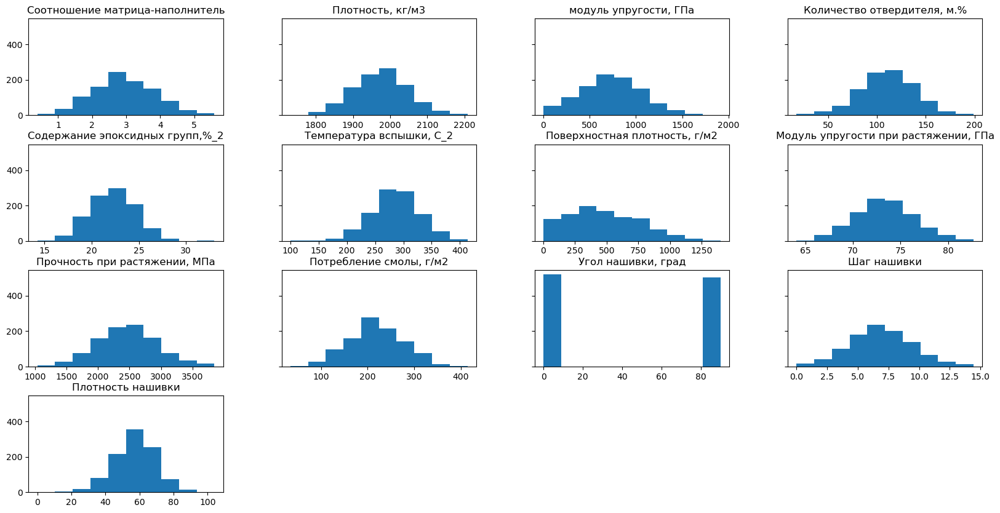

In [16]:
df.hist(figsize = (20, 10), grid = False, sharey = True)

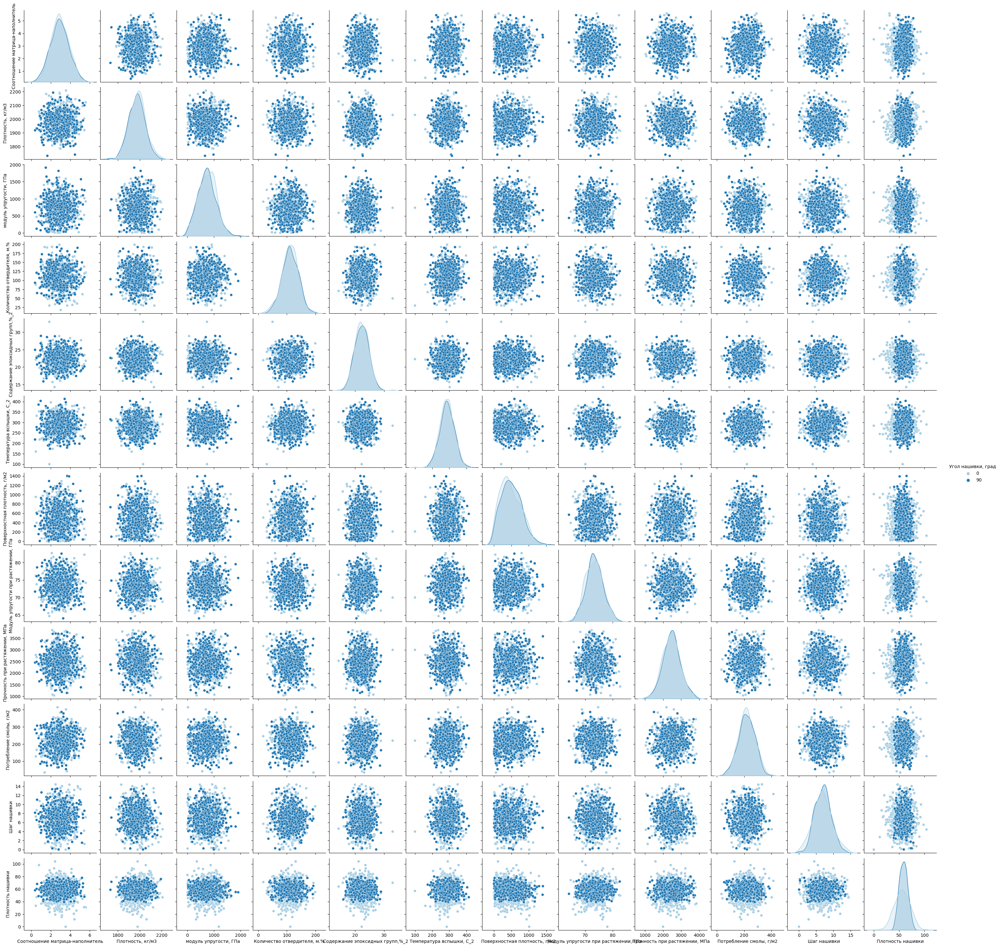

In [17]:
sns.pairplot(df, diag_kind='kde', hue='Угол нашивки, град', palette='Paired')

<AxesSubplot:>

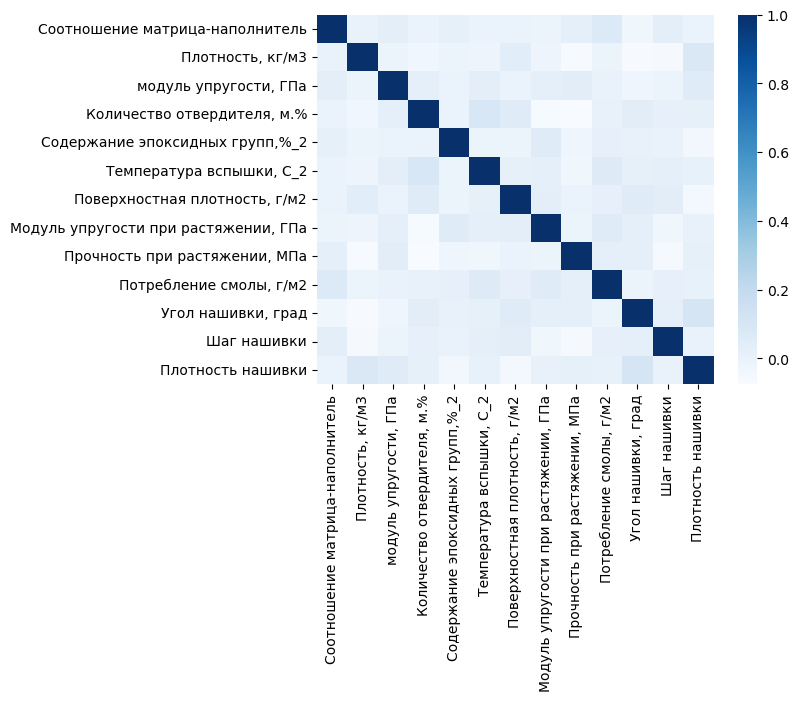

In [18]:
sns.heatmap(data=df.corr(), cmap='Blues')

In [19]:
# построение боксплотов, кроме угла нашивки
def boxplots(dataset):
    plt.figure(figsize=(20,15))
    plt.subplot(431)
    sns.boxplot(dataset['Соотношение матрица-наполнитель'], orient='h')
    plt.subplot(432)
    sns.boxplot(dataset['Плотность, кг/м3'], orient='h')
    plt.subplot(433)
    sns.boxplot(dataset['модуль упругости, ГПа'], orient='h')
    plt.subplot(434)
    sns.boxplot(dataset['Количество отвердителя, м.%'], orient='h')
    plt.subplot(435)
    sns.boxplot(dataset['Содержание эпоксидных групп,%_2'], orient='h')
    plt.subplot(436)
    sns.boxplot(dataset['Температура вспышки, С_2'], orient='h')
    plt.subplot(437)
    sns.boxplot(dataset['Поверхностная плотность, г/м2'], orient='h')
    plt.subplot(438)
    sns.boxplot(dataset['Модуль упругости при растяжении, ГПа'], orient='h')
    plt.subplot(439)
    sns.boxplot(dataset['Прочность при растяжении, МПа'], orient='h')
    plt.subplot(4,3,10)
    sns.boxplot(dataset['Потребление смолы, г/м2'], orient='h')
    plt.subplot(4,3,11)
    sns.boxplot(dataset['Шаг нашивки'], orient='h')
    plt.subplot(4,3,12)
    sns.boxplot(dataset['Плотность нашивки'], orient='h')

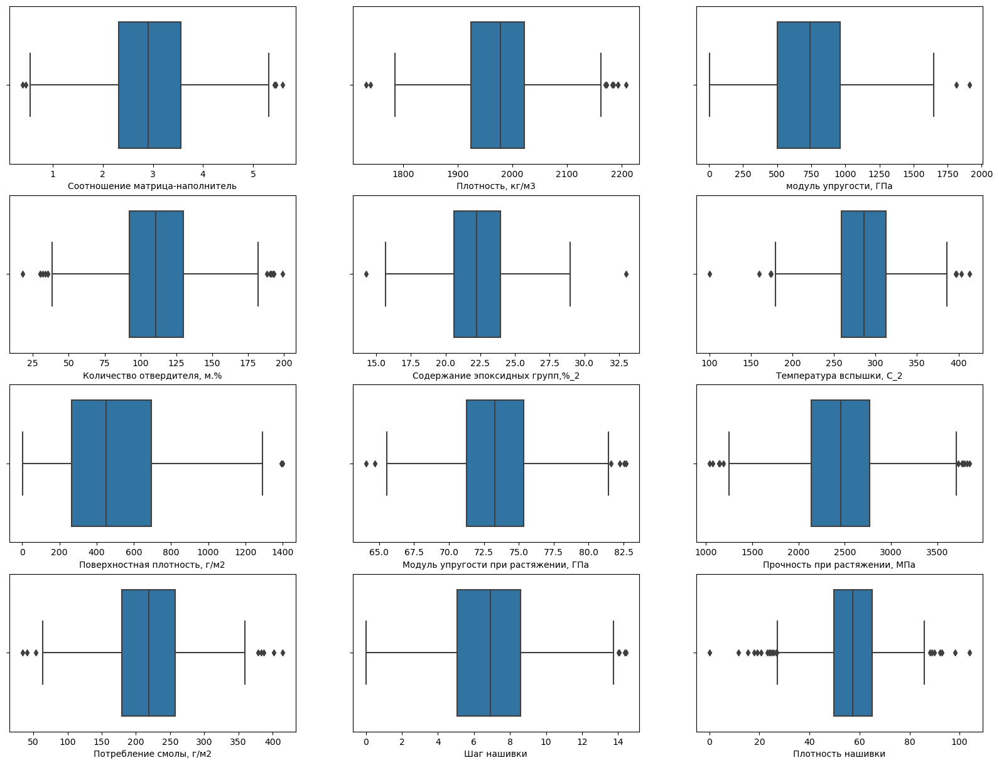

In [20]:
# построение боксплотов, кроме угла нашивки
boxplots(df)

<AxesSubplot:>

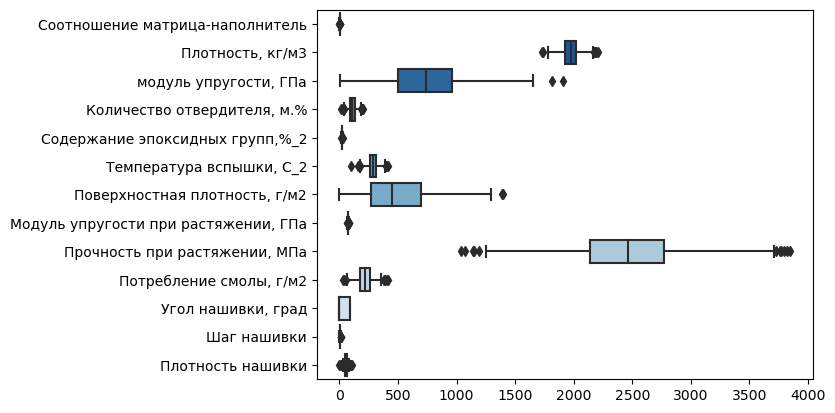

In [21]:
sns.boxplot(data=df, orient='h', palette='Blues_r')

In [22]:
#смотрим автоматический отчет пандас
import pandas_profiling
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# ПРЕДОБРАБОТКА ДАННЫХ

# Очистка от выбросов

In [23]:
# подсчет количества выбросов методом межквартильных расстояний (и оборачиваем в функцию для проверки после очистки)
q = df.copy()
def q_count(dataset):
    out_all = 0
    for i in dataset.columns:
        q25,q75 = np.percentile(dataset.loc[:,i],[25,75])
        iqr = q75-q25
        min = q25-(1.5*iqr)
        max = q75+(1.5*iqr)
        out = len(dataset.loc[dataset[i] < min,i])+len(dataset.loc[dataset[i] > max,i])
        out_all += out
        print(f'{out} выбросов в колонке "{i}"')
    print(f'Всего {out_all} выбросов')
q_count(q)

6 выбросов в колонке "Соотношение матрица-наполнитель"
9 выбросов в колонке "Плотность, кг/м3"
2 выбросов в колонке "модуль упругости, ГПа"
14 выбросов в колонке "Количество отвердителя, м.%"
2 выбросов в колонке "Содержание эпоксидных групп,%_2"
8 выбросов в колонке "Температура вспышки, С_2"
2 выбросов в колонке "Поверхностная плотность, г/м2"
6 выбросов в колонке "Модуль упругости при растяжении, ГПа"
11 выбросов в колонке "Прочность при растяжении, МПа"
8 выбросов в колонке "Потребление смолы, г/м2"
0 выбросов в колонке "Угол нашивки, град"
4 выбросов в колонке "Шаг нашивки"
21 выбросов в колонке "Плотность нашивки"
Всего 93 выбросов


In [24]:
# подсчет количества выбросов в исходном датасете методом 3 сигм (тоже оборачиваем в функцию)
z = df.copy()
def z_count(dataset):
    for i in dataset.columns:
        dataset[i] = abs((dataset[i] - dataset[i].mean()) / dataset[i].std())
        print(f'{sum(dataset[i] > 3)} выбросов в колонке "{i}"')
    print(f'Всего {sum(sum(dataset.values > 3))} выбросов')
z_count(z)

0 выбросов в колонке "Соотношение матрица-наполнитель"
3 выбросов в колонке "Плотность, кг/м3"
2 выбросов в колонке "модуль упругости, ГПа"
2 выбросов в колонке "Количество отвердителя, м.%"
2 выбросов в колонке "Содержание эпоксидных групп,%_2"
3 выбросов в колонке "Температура вспышки, С_2"
2 выбросов в колонке "Поверхностная плотность, г/м2"
0 выбросов в колонке "Модуль упругости при растяжении, ГПа"
0 выбросов в колонке "Прочность при растяжении, МПа"
3 выбросов в колонке "Потребление смолы, г/м2"
0 выбросов в колонке "Угол нашивки, град"
0 выбросов в колонке "Шаг нашивки"
7 выбросов в колонке "Плотность нашивки"
Всего 24 выбросов


In [25]:
# вариант 1: удаляем выбросы, метод межквартильных расстояний (после проб оборачиваем в функцию)
def q_clean(dataset):
    for i in dataset:
        q25,q75 = np.percentile(dataset.loc[:,i],[25,75])
        iqr = q75-q25
        min = q25-(1.5*iqr)
        max = q75+(1.5*iqr)
        dataset.loc[dataset[i] < min,i] = np.nan
        dataset.loc[dataset[i] > max,i] = np.nan
    return dataset

In [26]:
# (см. повторные отчеты по df_clean)
# после 1 очистки остается 936 значений в каждом столбце, значения null отсутствуют,
# методом межквартильных расстояний все еще находит 10 выбросов, методом 3 сигм выбросов 0

In [27]:
# вариант 2: удаляем выбросы, метод трех сигм
# (см. повторные отчеты по df_clean)
# после такой очистки остается 1000 значений в каждом столбце, значения null отсутствуют,
# методом межквартильных расстояний находит аж 68 выбросов, методом 3 сигм выбросов 4

In [28]:
# вариант 3: заменяем медианой или средним, метод межквартильных расстояний
# (см. повторные отчеты по df_clean)
# после таких очисток остается 1023 значений в каждом столбце, значения null отсутствуют,
# методом межквартильных расстояний 93 выброса и методом 3 сигм выбросов 24 (нигде не уменьшилось)

In [29]:
# вариант 4: заменяем медианой или средним, метод трех сигм
# (см. повторные отчеты по df_clean)
# после таких очисток остается 1023 значений в каждом столбце, значения null отсутствуют,
# методом межквартильных расстояний 93 выброса и методом 3 сигм выбросов 24 (тоже не уменьшились)

In [55]:
# тройная очистка по методу межквартильных расстояний
df_clean = df.copy()
for i in range(3):
    q_clean(df_clean)
    df_clean = df_clean.dropna(axis=0)
df_clean

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,60.000000
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


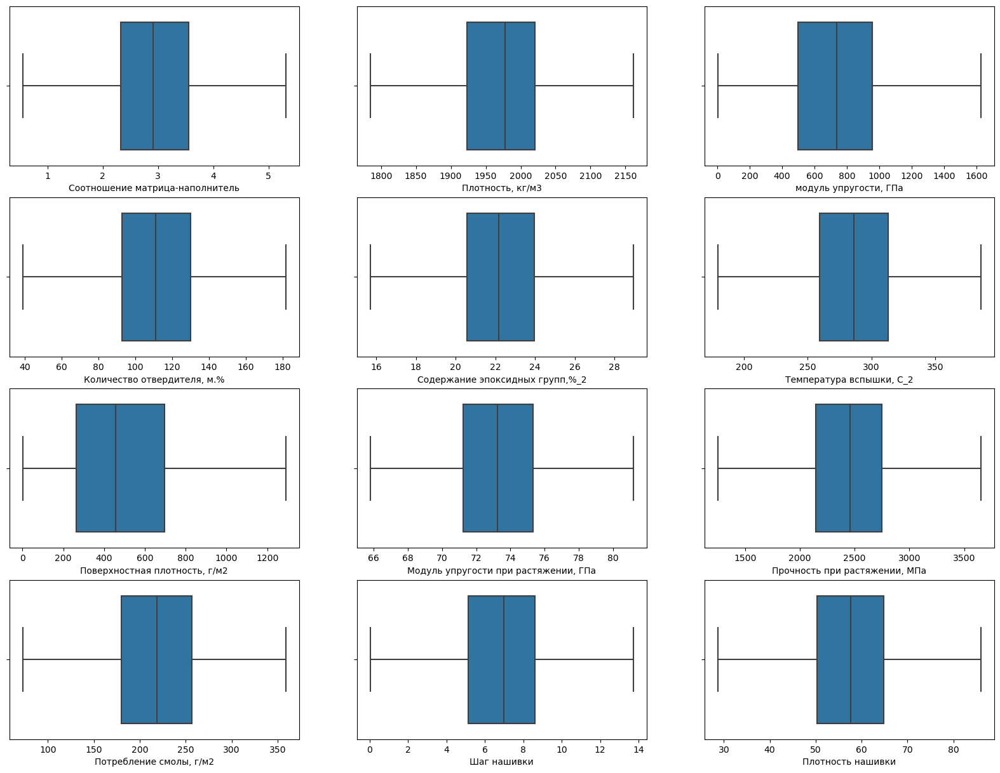

In [56]:
# построение боксплотов, кроме угла нашивки
boxplots(df_clean)

In [59]:
# подсчет количества выбросов методом межквартильных расстояний
q_count(df_clean)

7 выбросов в колонке "Соотношение матрица-наполнитель"
12 выбросов в колонке "Плотность, кг/м3"
7 выбросов в колонке "модуль упругости, ГПа"
11 выбросов в колонке "Количество отвердителя, м.%"
10 выбросов в колонке "Содержание эпоксидных групп,%_2"
12 выбросов в колонке "Температура вспышки, С_2"
7 выбросов в колонке "Поверхностная плотность, г/м2"
7 выбросов в колонке "Модуль упругости при растяжении, ГПа"
10 выбросов в колонке "Прочность при растяжении, МПа"
0 выбросов в колонке "Потребление смолы, г/м2"
0 выбросов в колонке "Угол нашивки, град"
16 выбросов в колонке "Шаг нашивки"
8 выбросов в колонке "Плотность нашивки"
Всего 107 выбросов


In [58]:
# подсчет количества выбросов методом 3 сигм
z_count(df_clean)

0 выбросов в колонке "Соотношение матрица-наполнитель"
0 выбросов в колонке "Плотность, кг/м3"
0 выбросов в колонке "модуль упругости, ГПа"
0 выбросов в колонке "Количество отвердителя, м.%"
0 выбросов в колонке "Содержание эпоксидных групп,%_2"
0 выбросов в колонке "Температура вспышки, С_2"
0 выбросов в колонке "Поверхностная плотность, г/м2"
0 выбросов в колонке "Модуль упругости при растяжении, ГПа"
0 выбросов в колонке "Прочность при растяжении, МПа"
0 выбросов в колонке "Потребление смолы, г/м2"
0 выбросов в колонке "Угол нашивки, град"
0 выбросов в колонке "Шаг нашивки"
0 выбросов в колонке "Плотность нашивки"
Всего 0 выбросов


In [34]:
df_clean.to_excel('../data/df_clean.xlsx')

# Стандартизация и нормализация

In [35]:
# вариант 1 - стандартизация

In [50]:
# вариант 2 - нормализация
df_clean_norm = df_clean.copy()
scaler_norm = MinMaxScaler()
scaler_norm.fit(df_clean_norm)
df_clean_norm = pd.DataFrame (data = scaler_norm.transform(df_clean_norm), columns = df_clean_norm.columns)
df_clean_norm

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.448746,0.293739,0.001416,0.843586,0.228799,0.014275,0.336758,0.416759,0.444628,0.012565,1.0,0.425153,0.084253
1,0.448746,0.293739,0.001416,0.246283,0.140070,0.129042,0.336758,0.416759,0.444628,0.012565,1.0,0.280076,0.365431
2,0.065619,0.293739,0.017432,0.009692,0.009200,0.014275,0.336758,0.416759,0.444628,0.012565,1.0,0.280076,0.019398
3,0.067049,0.135331,0.011818,0.009692,0.009200,0.014275,0.336758,0.416759,0.444628,0.012565,1.0,0.280076,0.084253
4,0.150154,0.337235,0.078071,0.009692,0.009200,0.014275,0.336758,0.416759,0.444628,0.012565,1.0,0.280076,0.430286
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.275157,0.115000,0.196940,0.332967,0.307012,0.361090,0.337748,0.024528,0.061238,0.639067,0.0,0.310905,0.364747
918,0.216250,0.399815,0.325686,0.480692,0.384573,0.299012,0.162861,0.046118,0.083449,0.689122,0.0,0.526959,0.131832
919,0.147764,0.007890,0.357012,0.008017,0.259543,0.353265,0.318565,0.179135,0.166283,0.126786,0.0,0.401773,0.348265
920,0.325771,0.488051,0.004491,0.417417,0.436848,0.097032,0.196576,0.091370,0.321816,0.143041,0.0,0.089561,0.024080


In [37]:
# вариант 3 - нормализация после стандартизации

In [38]:
# вариант 4 - стандартизация после нормализации

In [39]:
# смотрим получившиеся итоги после препроцессинга
df_prep = df_clean_norm

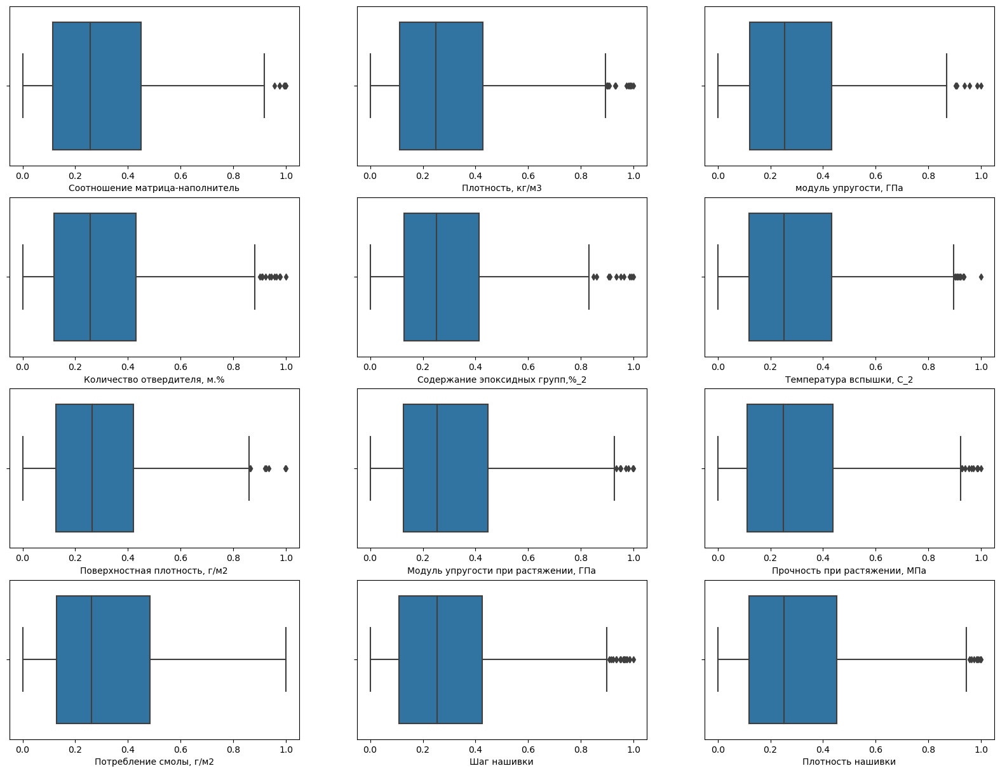

In [40]:
# построение боксплотов, кроме угла нашивки
boxplots(df_prep)

In [ ]:
sns.boxplot(data=df_prep, orient='h', palette='Blues_r')

In [ ]:
df_prep.sample(n=10, random_state=42).T

In [ ]:
df_prep.info()

In [ ]:
df_prep.nunique()

In [ ]:
df_prep.describe().T

In [ ]:
df_prep.hist(figsize = (20, 10), grid = False, sharey = True)

In [ ]:
sns.pairplot(df_prep, diag_kind='kde', hue='Угол нашивки, град', palette='Paired')

In [ ]:
sns.heatmap(data=df_prep.corr(), cmap='Blues')

In [ ]:
# итого полученные очищенные и предобработанные данные сохраняем для построения моделей
df_prep.to_excel('../data/df_prep.xlsx')